In [2]:
import numpy as np 
import matplotlib.pyplot as plt 
import soundfile as sf
import wave as fw
from scipy.io.wavfile import write as wavwrite
import IPython
#from pygame import * #Only pycharm

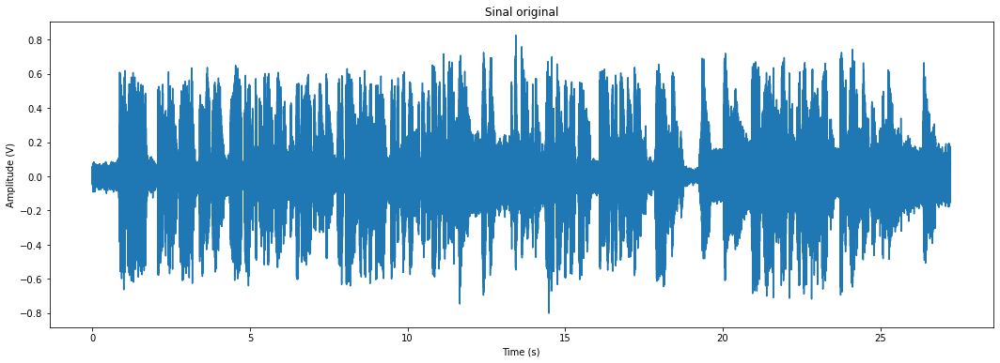

In [3]:
#Importação do sinal e sua mostragem no tempo

sinal, amostragem = sf.read('ovelhaMONO.wav')
time = np.arange(0, len(sinal) * 1/amostragem, 1/amostragem)

#mixer.init()                       #Only pycharm
#mixer.music.load('ovelhaMono.wav') #Only pycharm
#mixer.music.play()                 #Only pycharm

plt.figure(figsize=(18,6))
plt.plot(time, sinal)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (V)')
plt.title('Sinal original')
plt.show()

#Importação do áudio a ser reproduzido pelo player
fname = 'ovelhaMono.wav'
IPython.display.Audio(fname)

C:\Users\LUIZFI~1\AppData\Local\Temp/ipykernel_6308/2424019443.py:10: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  Amplitude = np.fromstring(frames, tipos)/Damp


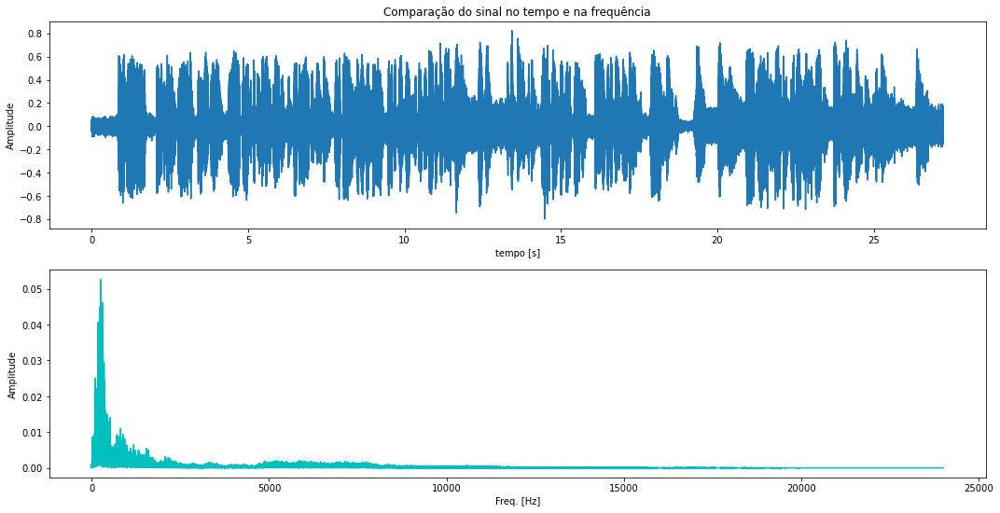

<Figure size 432x288 with 0 Axes>

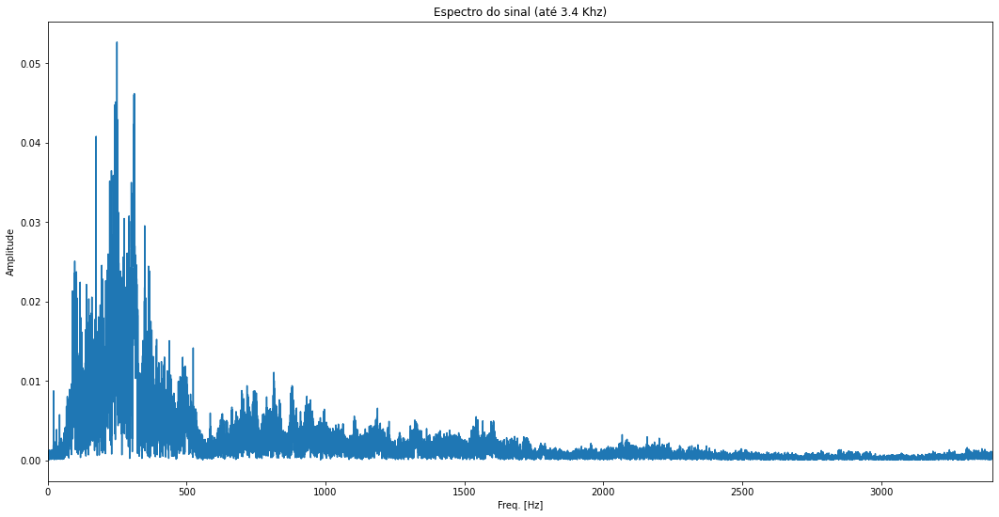

<Figure size 432x288 with 0 Axes>

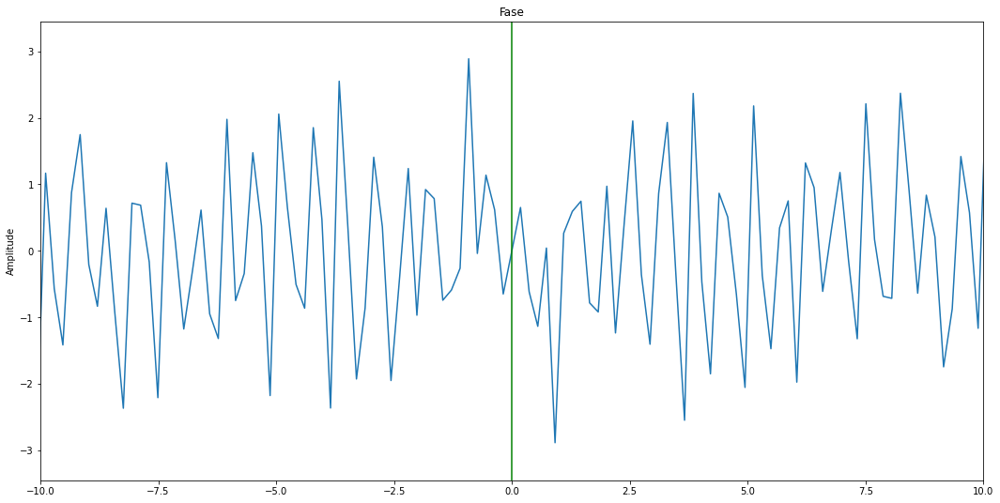

In [4]:
#Importando o áudio
arquivo = 'ovelhaMONO.wav'
arquivoWav = fw.open(arquivo, 'r')

#Forçando o áudio a ser do tipo int16
tipos = np.int16
Damp = 32760
frames = arquivoWav.readframes(-1)
#Criando o np.array das amostragens do sinal
Amplitude = np.fromstring(frames, tipos)/Damp

arquivoWav.close()

#Fazendo a FFT (Fast Fourier Transform)
N = 2**18
Tam = time[1]- time[0]
FFT = np.fft.fft(Amplitude,N) * Tam
FFT_2 = np.fft.fft(Amplitude)
w = np.fft.fftfreq(len(FFT), d=Tam)
wd = np.fft.fftshift(w)
Xd = np.fft.fftshift(FFT)

ModX = np.abs(Xd)
phaseD = np.angle(np.fft.fftshift(FFT))

#Plotagem dos gráficos
fig, ax = plt.subplots(2, 1,figsize=(18,9))

ax[0].title.set_text('Comparação do sinal no tempo e na frequência') 

ax[0].plot(time, sinal)
ax[0].set_ylabel("Amplitude")
ax[0].set_xlabel("tempo [s]")

ax[1].plot(wd[131072:],ModX[131072:], 'c-',  label="|X(jw)|")
ax[1].set_ylabel("Amplitude")
ax[1].set_xlabel("Freq. [Hz]")


plt.figure()
plt.figure(figsize=(18,9))
plt.plot(wd,ModX)

plt.title('Espectro do sinal (até 3.4 Khz)')
plt.xlabel("Freq. [Hz]")
plt.ylabel("Amplitude")
plt.xlim(left=0)
plt.xlim(xmax = 3400)
plt.show()

plt.figure()
plt.figure(figsize=(18,9))
plt.plot(wd,phaseD)
plt.ylabel("Amplitude")
plt.title('Fase')
plt.axvline(x = 0, color = "green") # Plotting a single vertical line
plt.xlim(left=-10)
plt.xlim(xmax = 10)
plt.show()

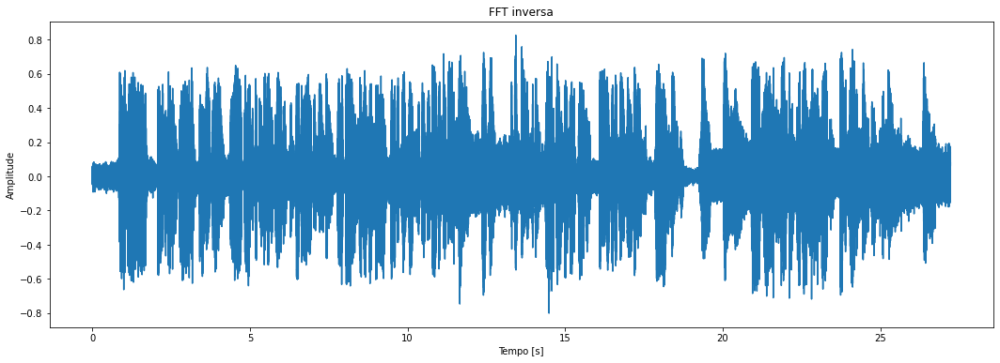

In [5]:
#Fazendo a inversa da FFT a fim de obter o mesmo resultado do sinal original
FFT_inverted = np.real(np.fft.ifft(FFT_2))

plt.figure(figsize=(18,6))
plt.plot(time,FFT_inverted)
plt.title('FFT inversa')
plt.xlabel("Tempo [s]")
plt.ylabel("Amplitude")
plt.show()

#Salvando o sinal em arquivo .WAV
amplitude = np.iinfo(np.int16).max
data = amplitude * FFT_inverted

wavwrite("audioFFT.wav", amostragem, data.astype(np.int16))

fname = 'audioFFT.wav'
IPython.display.Audio(fname)

<Figure size 432x288 with 0 Axes>

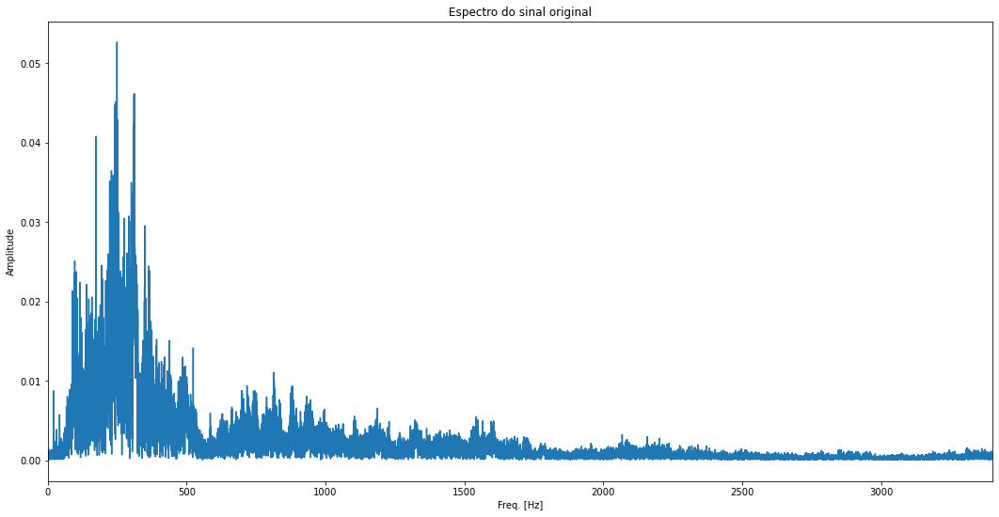

<Figure size 432x288 with 0 Axes>

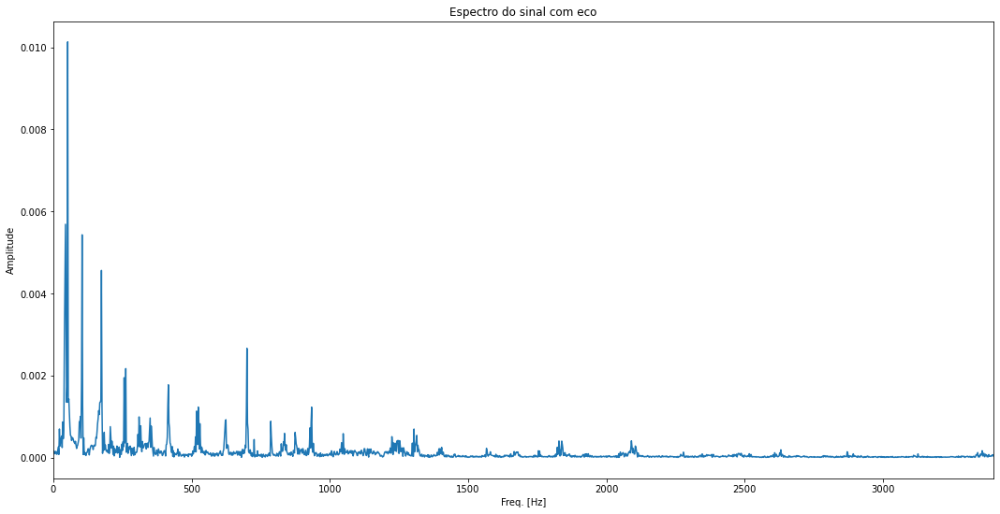

<Figure size 432x288 with 0 Axes>

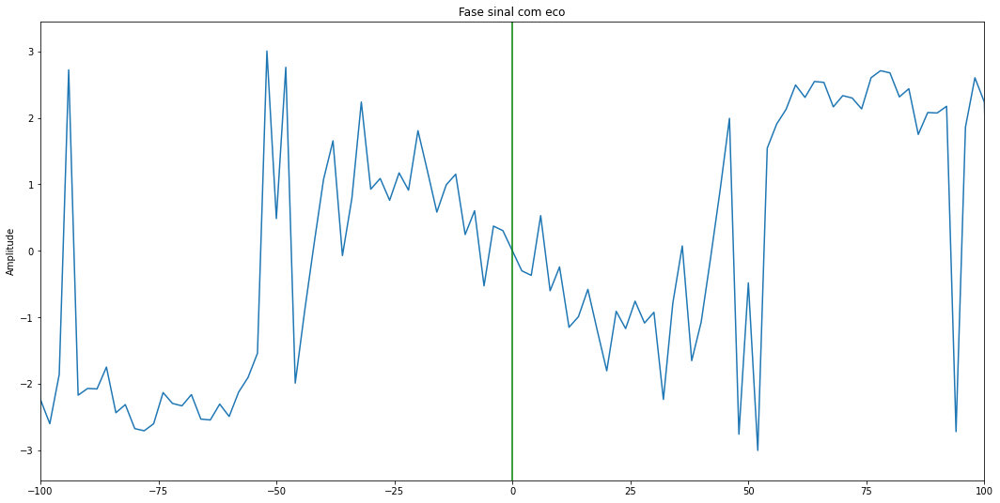

In [6]:
#Criação do sistema LTI - efeito sonoro de eco
echo = sinal.copy()
Amplitude_sinal  = sinal
N = int(amostragem/2)

for i in range(len(Amplitude)):
    echo[i] = Amplitude_sinal[i] + 0.5 * Amplitude_sinal[i-N]

#Fazendo a FFT do sinal depois de passar pelo sistema
echo_FFT = np.fft.fft(echo,N) * Tam
echo_FFT_2 = np.fft.fft(echo)
w_echo = np.fft.fftfreq(len(echo_FFT), d=Tam)
wd_echo = np.fft.fftshift(w_echo)
Xd_echo = np.fft.fftshift(echo_FFT)
ModX_echo = np.abs(Xd_echo)
phaseD_echo = np.angle(np.fft.fftshift((echo_FFT)))


plt.figure()
plt.figure(figsize=(18,9))
plt.plot(wd,ModX)
plt.title('Espectro do sinal original')
plt.xlabel("Freq. [Hz]")
plt.ylabel("Amplitude")
plt.xlim(left=0)
plt.xlim(xmax = 3400)
plt.show()

plt.figure() 
plt.figure(figsize=(18,9))
plt.plot(wd_echo,ModX_echo)
plt.title('Espectro do sinal com eco')
plt.xlabel("Freq. [Hz]")
plt.ylabel("Amplitude")
plt.xlim(left=0)
plt.xlim(xmax = 3400)
plt.show()

plt.figure() 
plt.figure(figsize=(18,9))
plt.plot(wd_echo,phaseD_echo)
plt.xlim(left=-100)
plt.xlim(xmax = 100)
plt.ylabel("Amplitude")
plt.axvline(x = 0, color = "green") # Plotting a single vertical line
plt.title('Fase sinal com eco')

plt.show()


Amplitude2 = np.iinfo(np.int16).max

data2 = Amplitude2 * (np.real (np.fft.ifft(echo_FFT_2)))

wavwrite("ovelha_eco.wav", amostragem, data2.astype(np.int16))

fname = 'ovelha_eco.wav'
IPython.display.Audio(fname)

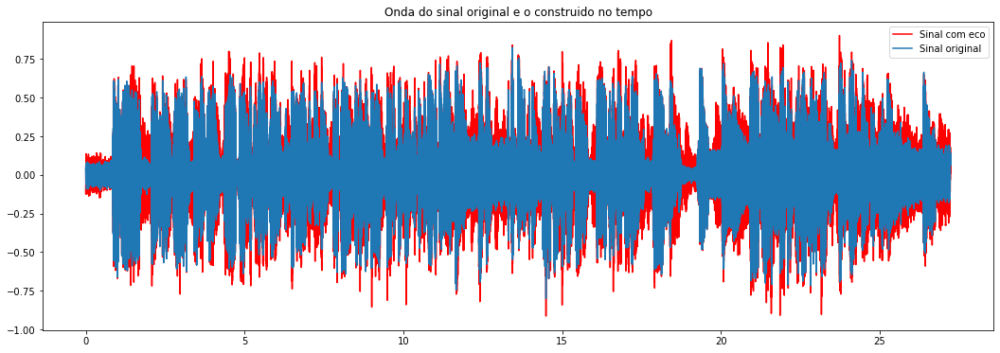

In [7]:
#Plotagem dos sinais - original e pós sistema - sobrepostos
plt.figure(figsize=(18,6))
plt.title('Onda do sinal original e o construido no tempo')
plt.plot(time, np.real (np.fft.ifft(echo_FFT_2)), 'r')

plt.plot(time, sinal)
plt.legend(["Sinal com eco", "Sinal original"], loc ="upper right")
plt.show()

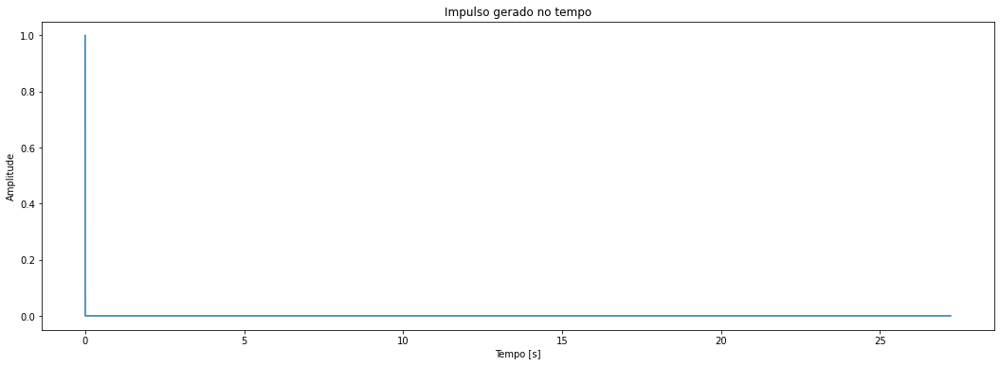

In [8]:
#Criando o np.array do impulso
n = np.arange(0, len(time))
l = np.size(n)
imp = np.zeros(l)
ind = np.where(n==0)
imp[ind] = 1

#Plotando o impulso gerado
plt.figure(figsize=(18,6))
plt.title("Impulso gerado no tempo")
plt.xlabel("Tempo [s]")
plt.ylabel("Amplitude")
plt.plot(time,imp)
plt.show()


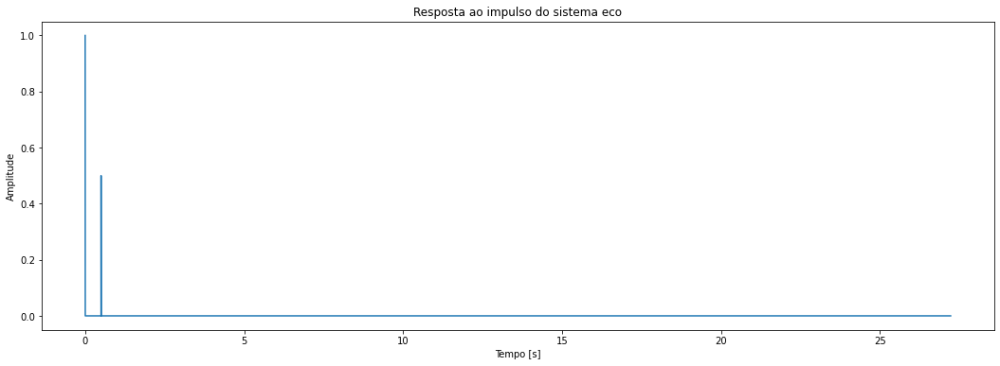

In [9]:
#Passando o impulso gerado no sistema LTI
N = int(amostragem/2)
data_impulse = imp.copy()
Amplitude_impulse  = imp

for i in range(len(imp)):
    data_impulse[i] = Amplitude_impulse[i] + 0.5 * Amplitude_impulse[i-N]
    
#Plotagem do da resposta ao impulso do sistema LTI eco
plt.figure(figsize=(18,6))
plt.xlabel("Tempo [s]")
plt.ylabel("Amplitude")
plt.plot(time,data_impulse)
plt.title('Resposta ao impulso do sistema eco')
plt.show()



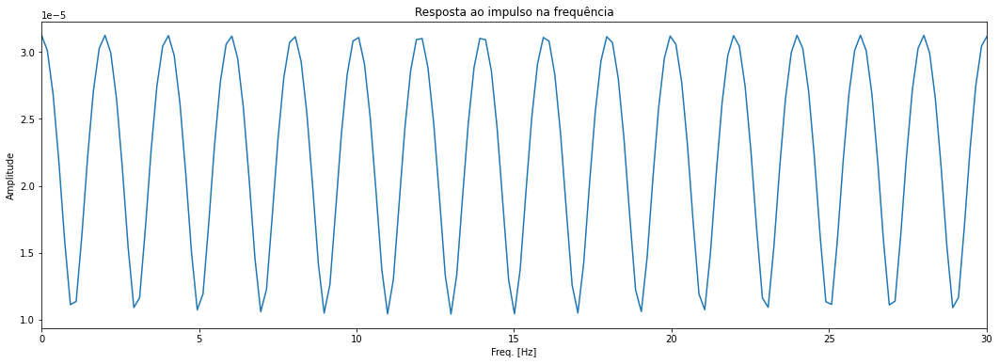

In [13]:
#Criando a FFT da resposta ao impulso gerado anteriormente
N = 2**18
Tam = time[1]- time[0]
FFT_abs_impulse = abs(np.fft.fft(data_impulse))
FFT_impulse = np.fft.fft(data_impulse,N) * Tam

w_impulse = np.fft.fftfreq(len(FFT_impulse), d=Tam)
wd_impulse = np.fft.fftshift(w_impulse)
Xd_impulse = np.fft.fftshift(FFT_impulse)
ModX_impulse = np.abs(Xd_impulse)

#Plotando a resposta ao impulso na frequencia
plt.figure(figsize=(18,6))
plt.xlabel("Freq. [Hz]")
plt.ylabel("Amplitude")
plt.plot(wd_impulse, ModX_impulse)
plt.xlim(left=0)
plt.xlim(xmax = 30)
plt.title('Resposta ao impulso na frequência')
plt.show()


Text(0.5, 1.0, 'Degrau em função do tempo')

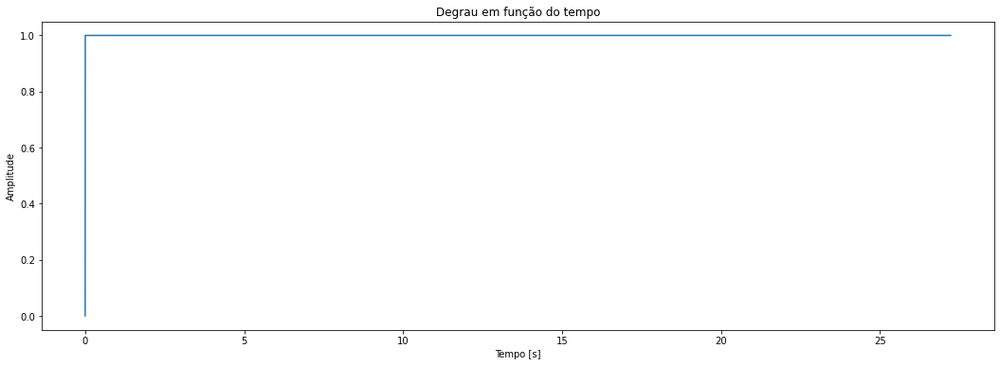

In [11]:
#Criando o np.array do degrau

n1 = np.arange(0,len(time))
l1 = np.size(n)
degree = np.zeros(l)
d = np.where(n>0)
degree[d] = 1

#Plotando o degrau gerado no tempo
plt.figure(figsize=(18,6))
plt.xlabel("Tempo [s]")
plt.ylabel("Amplitude")
plt.plot(time,degree)
plt.title("Degrau em função do tempo")



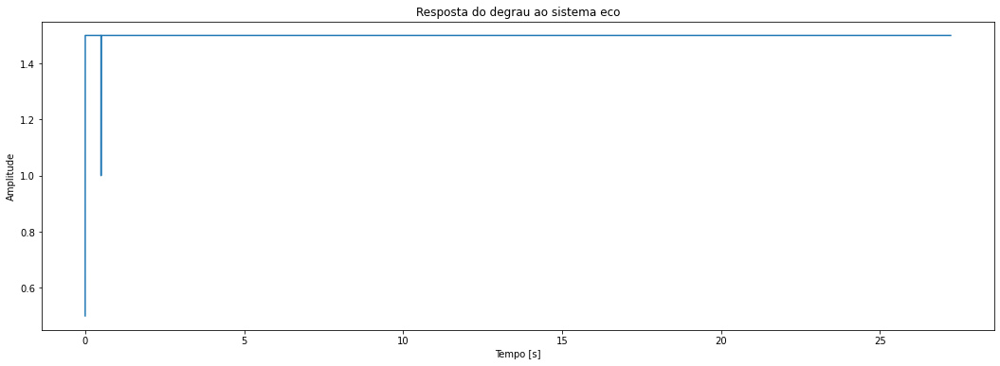

In [12]:
#Passando o degrau gerado no sistema LTI
N = int(amostragem/2)
data_degrau = degree.copy()
Amplitude_degrau  = degree

for i in range(len(degree)):
    data_degrau[i] = Amplitude_degrau[i] + 0.5 * Amplitude_degrau[i-N]
    
#Plotagem do da resposta ao degrau do sistema LTI eco    
plt.figure(figsize=(18,6))
plt.title("Resposta do degrau ao sistema eco")
plt.xlabel("Tempo [s]")
plt.ylabel("Amplitude")
plt.plot(time,data_degrau)
plt.show()